In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
%config InlineBackend.figure_format = 'retina'

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
epoch_key = ('HPa', 4, 2)


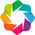

INFO:src.analysis:Detecting ripples
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO04.mat
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO04.mat


In [4]:
from src.analysis import detect_epoch_ripples
from src.parameters import (ANIMALS, SAMPLING_FREQUENCY)

ripple_times = detect_epoch_ripples(
    epoch_key, ANIMALS, SAMPLING_FREQUENCY)

In [5]:
from src.analysis import decode_ripple_clusterless

replay_info, _, _ = decode_ripple_clusterless(
    epoch_key, ANIMALS, ripple_times)

INFO:src.analysis:Decoding ripples
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO04.mat
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO04.mat
INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...
INFO:src.analysis:Predicting replay types


In [6]:
replay_info.head()

,ripple_number,start_time,end_time,animal,day,epoch,ripple_duration,predicted_state,predicted_state_probability,replay_task,...,from_well,to_well,task,is_correct,x_position,y_position,head_direction,speed,linear_distance,replay_motion
0,1,00:45:22.177265,00:45:22.223932,HPa,4,2,00:00:00.046667,Inbound-Forward,0.802154,Inbound,...,NaN,NaN,NaN,NaN,125.450000,99.068316,1.691543,3.012797,186.076720,Away
1,2,00:45:36.431931,00:45:36.697265,HPa,4,2,00:00:00.265334,Unclassified,NaN,Unclassified,...,NaN,NaN,NaN,NaN,97.500000,104.000000,0.643501,0.070687,0.000000,Away
2,3,00:45:37.763265,00:45:37.832598,HPa,4,2,00:00:00.069333,Unclassified,NaN,Unclassified,...,NaN,NaN,NaN,NaN,97.500000,104.000000,0.682317,0.013565,0.000000,Towards
3,4,00:45:45.919931,00:45:45.981264,HPa,4,2,00:00:00.061333,Unclassified,NaN,Unclassified,...,center,left,Outbound,True,102.245214,72.995214,-1.098963,2.428777,28.665722,Towards
4,5,00:46:08.883930,00:46:08.929263,HPa,4,2,00:00:00.045333,Inbound-Forward,0.929118,Inbound,...,NaN,NaN,NaN,NaN,60.450000,97.500000,1.650626,1.784642,184.272509,Away


In [7]:
from loren_frank_data_processing import make_neuron_dataframe

neuron_info = make_neuron_dataframe(ANIMALS).xs(
    epoch_key, drop_level=False).query('numspikes > 0')

In [8]:
neuron_info.head()

area       csi  meanrate  \
animal day epoch tetrode_number neuron_number                            
HPa    4   2     1              1              CA1  0.141379  0.239472   
                                2              CA1  0.080055  2.413708   
                                3              CA1  0.076687  0.269199   
                                4              CA1  0.105769  0.257638   
                                5              CA1  0.125000  0.006606   

                                                       neuron_id  numspikes  \
animal day epoch tetrode_number neuron_number                                 
HPa    4   2     1              1              HPa_04_02_001_001      290.0   
                                2              HPa_04_02_001_002     2923.0   
                                3              HPa_04_02_001_003      326.0   
                                4              HPa_04_02_001_004      312.0   
                                5              HPa_04_02_001_005        8.0   

                                               propbursts  spikewidth  
animal day epoch tetrode_number neuron_number                          
HPa    4   2     1              1                0.462069    8.879580  
                                2                0.298324   10.638930  
                                3                0.254601    9.540568  
                                4                0.352564    8.744772  
                                5                0.500000    7.337474

In [9]:
from loren_frank_data_processing import make_tetrode_dataframe

tetrode_info = make_tetrode_dataframe(ANIMALS).xs(epoch_key, drop_level=False)

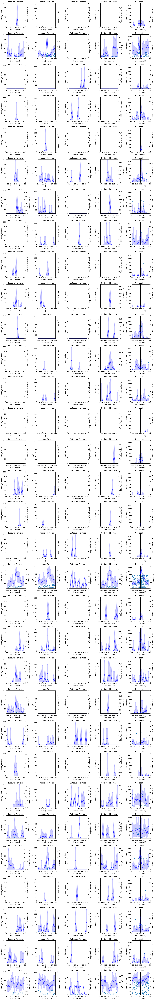

In [14]:
from src.visualization import plot_perievent_raster

n_states = len(replay_info.predicted_state.unique())
n_neurons = len(neuron_info.index)
fig, axes = plt.subplots(n_neurons, n_states, figsize=(n_states * 3, n_neurons * 3))

for neuron_key, ax_row in zip(neuron_info.index, axes):
    for ax, (name, df) in zip(ax_row, replay_info.set_index('ripple_number').groupby('predicted_state')):
        plot_perievent_raster(neuron_key, ANIMALS, df.loc[:, ['start_time', 'end_time']],
                              tetrode_info, window_offset=(-0.5, 0.5),
                              ax=ax, s=1)
        ax.set_title(name)
    
plt.tight_layout()

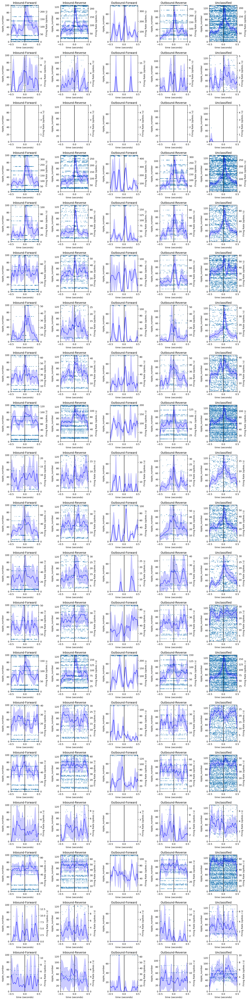

In [12]:
n_states = len(replay_info.predicted_state.unique())
n_tetrodes = len(tetrode_info.index)
fig, axes = plt.subplots(n_tetrodes, n_states, figsize=(n_states * 3, n_tetrodes * 3))

for tetrode_key, ax_row in zip(tetrode_info.index, axes):
    for ax, (name, df) in zip(ax_row, replay_info.set_index('ripple_number').groupby('predicted_state')):
        plot_perievent_raster(tetrode_key, ANIMALS, df.loc[:, ['start_time', 'end_time']],
                              tetrode_info, window_offset=(-0.5, 0.5),
                              ax=ax, s=1)
        ax.set_title(name)
    
plt.tight_layout()

In [13]:
replay_info.predicted_state.value_counts()

Unclassified        78
Inbound-Reverse     25
Outbound-Reverse    13
Inbound-Forward     12
Outbound-Forward     2
Name: predicted_state, dtype: int64